# EDA on 1000 Movies IMDB Ratings Data



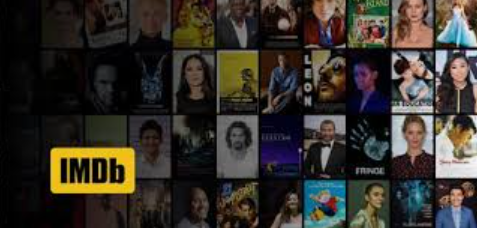

## Table of Contents

1. [Problem Statement](#section1)<br>
2. [Importing Packages](#section2)<br>
3. [Importing 1000 Movies Dataset](#section3)<br>
  - 3.1 [Description of the Datasets](#section301)<br>
  - 3.2 [Pandas Profiling before Data Preprocessing](#section302)<br>
4. [Data Preprocessing](#section4)<br>
  - 4.1 [Dropping of Columns of least value for our analysis](#section401)<br>
  - 4.2 [Replacing Missing data from Revenue and Metascore columns](#section402)<br>
  - 4.3 [Identifying possible duplicates](#section403)<br>
  - 4.4 [Pandas Profiling after Data Preprocessing](#section404)<br>
5. [Exploratory Data Analysis](#section5)<br>
  - 5.1 [**Analysis Based on Yearly Metrics**](#section501)<br>
    - 5.1.1 [How many movies are released in each year?](#section50101)<br>
    - 5.1.2 [Which year generated the highest revenue?](#section50102)<br>
  - 5.2 [**Analysis Based on Movie Revenue**](#section502)<br>
    - 5.2.1 [Which are the Top 10 Highest Revenue making movies?](#section50201)<br>
  - 5.3 [**Analyzing the coorelation between all the columns using heatmap**](#section503)<br>
  - 5.4 [**Comparision of movie ratings with each parameter**](#section504)<br>
  - 5.5 [**Analysis Based on various movie Genres**](#section505)<br>
    - 5.5.1 [Standardizing list of Genres by getting a unique list](#section50501)<br>
    - 5.5.2 [How many movies of each genre were released in each year?](#section50502)<br>
    - 5.5.3 [Determining the percentage of movies released in each Genre](#section50503)<br>
    - 5.5.4 [Determining revenue percentage received from each Genre](#section50504)<br>
    - 5.5.5 [Determining IMDB Ratings received for each Genre](#section50505)<br>
    - 5.5.6 [Determining Audience Votes received for each Genre](#section50506)<br>
  - 5.6 [**Analysis Based on the Director of the movies**](#section506)<br>
    - 5.6.1 [Which are the Top 10 Movie Directors who has made highest number of movies?](#section50601)<br>
    - 5.6.2 [Which are the Top 10 movie Directors in terms of Revenue contribution?](#section50602)<br>
6. [Conclusion](#section6)
  - 6.1 [Actionable Insights](#section601)

<a id=section1></a>
## 1. Problem Statement:

**IMBD Ratings has been one stop for all the Movie Fanatics who like to do a tiny research by viewing the ratings to see if the movie is worth their buck to go to the cinema hall. However, this happens much after the movie has hit the theaters.**

**The point to focus here is, would there be a way where we can predict movie revenue or its success way before a certain type of movie releases. This would significantly benefit the professionals in the Movie Business.**

**Let's see if we can predict the movie success by doing an Exploratory Data Analysis (EDA) to the IMDB dataset of 1000 movies from 2006-2016 and by comparing various elements of movies.**



<a id=section2></a>
## 2. Importing Required Packages

In [3]:
import numpy as np                     

import pandas as pd
pd.set_option('mode.chained_assignment', None)      # To suppress pandas warnings.
pd.set_option('display.max_colwidth', None)           # To display all the data in each column
pd.options.display.max_columns = 50                 # To display every column of the dataset in head()

import itertools       #provides various functions that work on iterators to produce complex iterators

import warnings
warnings.filterwarnings('ignore')                   # To suppress all the warnings in the notebook.

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set(style='whitegrid', font_scale=1.3, color_codes=True)      # To apply seaborn styles to the plots.

In [5]:
# Install and update plotly using this command to the latest version (higher than version 4.0.0)

!pip install plotly --upgrade

  Attempting uninstall: plotly
    Found existing installation: plotly 4.8.1
    Uninstalling plotly-4.8.1:
      Successfully uninstalled plotly-4.8.1


In [6]:
# Install chart_studio, please use this command. 

!pip install chart-studio

In [7]:
# Making plotly specific imports
# These imports are necessary to use plotly offline without signing in to their website.

from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import chart_studio.plotly as py
from plotly import tools
init_notebook_mode(connected=True)

<a id=section3></a>
## 3. Importing 1000 Movies Dataset

In [8]:
# Importing IMDB 1000 Movie Rating's dataset

df_movies = pd.read_csv('https://raw.githubusercontent.com/insaid2018/Term-1/master/Data/Projects/1000%20movies%20data.csv')
df_movies.head()

,Rank,Title,Genre,Description,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
0,1,Guardians of the Galaxy,"Action,Adventure,Sci-Fi",A group of intergalactic criminals are forced to work together to stop a fanatical warrior from taking control of the universe.,James Gunn,"Chris Pratt, Vin Diesel, Bradley Cooper, Zoe Saldana",2014,121,8.1,757074,333.13,76.0
1,2,Prometheus,"Adventure,Mystery,Sci-Fi","Following clues to the origin of mankind, a team finds a structure on a distant moon, but they soon realize they are not alone.",Ridley Scott,"Noomi Rapace, Logan Marshall-Green, Michael Fassbender, Charlize Theron",2012,124,7.0,485820,126.46,65.0
2,3,Split,"Horror,Thriller",Three girls are kidnapped by a man with a diagnosed 23 distinct personalities. They must try to escape before the apparent emergence of a frightful new 24th.,M. Night Shyamalan,"James McAvoy, Anya Taylor-Joy, Haley Lu Richardson, Jessica Sula",2016,117,7.3,157606,138.12,62.0
3,4,Sing,"Animation,Comedy,Family","In a city of humanoid animals, a hustling theater impresario's attempt to save his theater with a singing competition becomes grander than he anticipates even as its finalists' find that their lives will never be the same.",Christophe Lourdelet,"Matthew McConaughey,Reese Witherspoon, Seth MacFarlane, Scarlett Johansson",2016,108,7.2,60545,270.32,59.0
4,5,Suicide Squad,"Action,Adventure,Fantasy",A secret government agency recruits some of the most dangerous incarcerated super-villains to form a defensive task force. Their first mission: save the world from the apocalypse.,David Ayer,"Will Smith, Jared Leto, Margot Robbie, Viola Davis",2016,123,6.2,393727,325.02,40.0


<a id=section301></a>
### 3.1 Description of the Dataset

This dataset contains 1,000 most popular movies on IMDB released during the period of 2006 - 2016. The data fields included are; Title, Genre, Description, Director, Actors, Year, Runtime, Rating, Votes, Revenue, Metascore.

| Column Name                    | Description                                                                                |
| -------------------------------|:------------------------------------------------------------------------------------------:| 
| Rank                           | Movie Rank Order                                                                           | 
| Title                          | The Title of the Film                                                                      | 
| Genre                          | A comma-separated list of genres used to classify the film                                 | 
| Description                    | Brief one-sentence movie summary                                                           |
| Director                       | The name of the film's director                                                            |
| Actors                         | A comma-separated list of the main stars of the film                                       |
| Year                           | The year that the film released as an integer                                              |
| Runtime (Minutes)              | The duration of the film in minutes.                                                       |
| Rating                         | User rating for the movie 0-10                                                             |
| Votes                          | Number of Votes                                                                            |
| Revenue (Millions)             | Movie Revenue in millions                                                                  |
| Metascore                      | An aggregated average of critic scores. Values are between 0 and 100. 
                                   Higher scores represent positive reviews.
                                 

                                                     





In [7]:
df_movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Rank                1000 non-null   int64  
 1   Title               1000 non-null   object 
 2   Genre               1000 non-null   object 
 3   Description         1000 non-null   object 
 4   Director            1000 non-null   object 
 5   Actors              1000 non-null   object 
 6   Year                1000 non-null   int64  
 7   Runtime (Minutes)   1000 non-null   int64  
 8   Rating              1000 non-null   float64
 9   Votes               1000 non-null   int64  
 10  Revenue (Millions)  872 non-null    float64
 11  Metascore           936 non-null    float64
dtypes: float64(3), int64(4), object(5)
memory usage: 93.9+ KB


- **```info```** function gives us the following insights into the df_movies dataframe:

  - There are a total of **1000 samples (rows)** and **12 columns** in the dataframe.
  
  - There are **7 columns** with a **numeric** datatype and **5 columns** with an **object** datatype.
  
  - There are **2 columns** with **missing** values in the data.

In [9]:
df_movies.describe()

,Rank,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,872.000000,936.000000
mean,500.500000,2012.783000,113.172000,6.723200,1.698083e+05,82.956376,58.985043
std,288.819436,3.205962,18.810908,0.945429,1.887626e+05,103.253540,17.194757
min,1.000000,2006.000000,66.000000,1.900000,6.100000e+01,0.000000,11.000000
25%,250.750000,2010.000000,100.000000,6.200000,3.630900e+04,13.270000,47.000000
50%,500.500000,2014.000000,111.000000,6.800000,1.107990e+05,47.985000,59.500000
75%,750.250000,2016.000000,123.000000,7.400000,2.399098e+05,113.715000,72.000000
max,1000.000000,2016.000000,191.000000,9.000000,1.791916e+06,936.630000,100.000000


- **```describe```** function gives us the following insights into the data:
  
  - **Rating** column is having an almost **normal distribution** because the **mean (6.723)** value is close to the **median (6.800)** value.

  - The distribution of **Revenue** is **positive (right) skewed** because the **mean** of **Revenue (82.956)** lies to the **right** of the **median(50%)** value **(47.985)**, on a **distribution plot**. 
  
  - The **max** value of **Revenue (936.630)** is an **outlier** because it lie far away from the mean.
  
  - Similarly comparing the **75%** and **max** values of the other columns like **Metascore, Rank and Runtime** we can see that there are **outliers** present in some other columns.

<a id=section302></a>
### 3.2 Pandas Profiling before Data Preprocessing

In [10]:
#Package required by pandas profiling

!pip install -q datascience
!pip install -q pandas-profiling

In [11]:
#Upgrade pandas profiling

!pip install -q --upgrade pandas_profiling  

In [1]:
import pandas as pd

In [2]:
!pip install pandas-profiling --upgrade

Requirement already up-to-date: pandas-profiling in c:\users\vins_\anaconda3\lib\site-packages (2.8.0)


In [4]:
import pandas_profiling

In [9]:
#To output pandas profiling report to an external html file.
#Saving the output as profiling_before_preprocessing.html
'''''
profile = df_movies.profile_report(title='Movies Pandas Profiling before Data Preprocessing')
profile.to_file(output_file="movies profiling_before_preprocessing.html")
'''''

#To output the pandas profiling report on the notebook.

df_movies.profile_report(title='Pandas Profiling before Data Preprocessing')

- **Initial Observations**

- **Data types in the dataset:**
    Numeric = 7
    Categorical = 5 

1.	Title: The Host movie shows up twice
2.	Genre: Standardize categories as distinct values only 207
3.	Revenue: 
    a.	128 missing values. 
    b.	814 distinct values.  Common and extreme values to be checked
4.	Metascore: (ranges from 0 to 100….highest being the best)
    a.	64 missing values


<a id=section4></a>
## 4. Data Preprocessing

In [10]:
df_movies.head()

,Rank,Title,Genre,Description,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
0,1,Guardians of the Galaxy,"Action,Adventure,Sci-Fi",A group of intergalactic criminals are forced ...,James Gunn,"Chris Pratt, Vin Diesel, Bradley Cooper, Zoe S...",2014,121,8.1,757074,333.13,76.0
1,2,Prometheus,"Adventure,Mystery,Sci-Fi","Following clues to the origin of mankind, a te...",Ridley Scott,"Noomi Rapace, Logan Marshall-Green, Michael Fa...",2012,124,7.0,485820,126.46,65.0
2,3,Split,"Horror,Thriller",Three girls are kidnapped by a man with a diag...,M. Night Shyamalan,"James McAvoy, Anya Taylor-Joy, Haley Lu Richar...",2016,117,7.3,157606,138.12,62.0
3,4,Sing,"Animation,Comedy,Family","In a city of humanoid animals, a hustling thea...",Christophe Lourdelet,"Matthew McConaughey,Reese Witherspoon, Seth Ma...",2016,108,7.2,60545,270.32,59.0
4,5,Suicide Squad,"Action,Adventure,Fantasy",A secret government agency recruits some of th...,David Ayer,"Will Smith, Jared Leto, Margot Robbie, Viola D...",2016,123,6.2,393727,325.02,40.0


<a id=section401></a>
### 4.1 Dropping of Columns of least value for our analysis

- Column **Description** to be **dropped** because it **doesn't provide** any additional **insights** into the data.

In [15]:
df_movies.drop(['Description'], 1, inplace=True)

In [16]:
df_movies.head()

,Rank,Title,Genre,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
0,1,Guardians of the Galaxy,"Action,Adventure,Sci-Fi",James Gunn,"Chris Pratt, Vin Diesel, Bradley Cooper, Zoe Saldana",2014,121,8.1,757074,333.13,76.0
1,2,Prometheus,"Adventure,Mystery,Sci-Fi",Ridley Scott,"Noomi Rapace, Logan Marshall-Green, Michael Fassbender, Charlize Theron",2012,124,7.0,485820,126.46,65.0
2,3,Split,"Horror,Thriller",M. Night Shyamalan,"James McAvoy, Anya Taylor-Joy, Haley Lu Richardson, Jessica Sula",2016,117,7.3,157606,138.12,62.0
3,4,Sing,"Animation,Comedy,Family",Christophe Lourdelet,"Matthew McConaughey,Reese Witherspoon, Seth MacFarlane, Scarlett Johansson",2016,108,7.2,60545,270.32,59.0
4,5,Suicide Squad,"Action,Adventure,Fantasy",David Ayer,"Will Smith, Jared Leto, Margot Robbie, Viola Davis",2016,123,6.2,393727,325.02,40.0


<a id=section402></a>
### 4.2 Replacing Missing data from Revenue and Metascore columns

In [109]:
df_movies.isnull().sum()

Rank                    0
Title                   0
Genre                   0
Director                0
Actors                  0
Year                    0
Runtime (Minutes)       0
Rating                  0
Votes                   0
Revenue (Millions)    128
Metascore              64
dtype: int64

- Dealing with missing values<br/>
    - Replacing missing entries and zero values in __Revenue__ with Mean.
    - Replacing missing values of __Metascore__ with median values.

In [164]:
median_metascore = df_movies.Metascore.median()

In [163]:
df_movies.isnull().sum()

Rank                  0
Title                 0
Genre                 0
Director              0
Actors                0
Year                  0
Runtime (Minutes)     0
Rating                0
Votes                 0
Revenue (Millions)    0
Metascore             0
dtype: int64

In [19]:
df_movies.describe(include = 'all')   

,Rank,Title,Genre,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
count,1000.000000,1000,1000,1000,1000,1000.000000,1000.000000,1000.000000,1.000000e+03,872.000000,936.000000
unique,NaN,999,207,644,996,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,The Host,"Action,Adventure,Sci-Fi",Ridley Scott,"Jennifer Lawrence, Josh Hutcherson, Liam Hemsw...",NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,2,50,8,2,NaN,NaN,NaN,NaN,NaN,NaN
mean,500.500000,NaN,NaN,NaN,NaN,2012.783000,113.172000,6.723200,1.698083e+05,82.956376,58.985043
std,288.819436,NaN,NaN,NaN,NaN,3.205962,18.810908,0.945429,1.887626e+05,103.253540,17.194757
min,1.000000,NaN,NaN,NaN,NaN,2006.000000,66.000000,1.900000,6.100000e+01,0.000000,11.000000
25%,250.750000,NaN,NaN,NaN,NaN,2010.000000,100.000000,6.200000,3.630900e+04,13.270000,47.000000
50%,500.500000,NaN,NaN,NaN,NaN,2014.000000,111.000000,6.800000,1.107990e+05,47.985000,59.500000
75%,750.250000,NaN,NaN,NaN,NaN,2016.000000,123.000000,7.400000,2.399098e+05,113.715000,72.000000


In [10]:
median_metascore = df_movies.Metascore.median()
df_movies.Metascore.fillna(median_metascore, inplace = True)

In [11]:
df_movies.isnull().sum()

Rank                    0
Title                   0
Genre                   0
Description             0
Director                0
Actors                  0
Year                    0
Runtime (Minutes)       0
Rating                  0
Votes                   0
Revenue (Millions)    128
Metascore               0
dtype: int64

In [158]:
print("Revenue (Millions)")
print("Minimum value: ", df_movies["Revenue (Millions)"].min())
print("Minimum value: ", df_movies["Revenue (Millions)"].max())
print("How many values are missing?: ", pd.isnull(df_movies["Revenue (Millions)"]).sum())

Revenue (Millions)
Minimum value:  0.0
Minimum value:  936.63
How many values are missing?:  128


In [12]:
mean_Revenue = df_movies["Revenue (Millions)"].mean()
df_movies["Revenue (Millions)"].fillna(mean_Revenue, inplace = True)

In [13]:
df_movies.isnull().sum()

Rank                  0
Title                 0
Genre                 0
Description           0
Director              0
Actors                0
Year                  0
Runtime (Minutes)     0
Rating                0
Votes                 0
Revenue (Millions)    0
Metascore             0
dtype: int64

In [161]:
print("Revenue (Millions)")
print("Minimum value: ", df_movies["Revenue (Millions)"].min())

print("How many values are missing?: ", pd.isnull(df_movies["Revenue (Millions)"]).sum())

Revenue (Millions)
Minimum value:  0.0
How many values are missing?:  0


In [162]:
df_movies.head()

,Rank,Title,Genre,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
0,1,Guardians of the Galaxy,"Action,Adventure,Sci-Fi",James Gunn,"Chris Pratt, Vin Diesel, Bradley Cooper, Zoe Saldana",2014,121,8.1,757074,333.13,76.0
1,2,Prometheus,"Adventure,Mystery,Sci-Fi",Ridley Scott,"Noomi Rapace, Logan Marshall-Green, Michael Fassbender, Charlize Theron",2012,124,7.0,485820,126.46,65.0
2,3,Split,"Horror,Thriller",M. Night Shyamalan,"James McAvoy, Anya Taylor-Joy, Haley Lu Richardson, Jessica Sula",2016,117,7.3,157606,138.12,62.0
3,4,Sing,"Animation,Comedy,Family",Christophe Lourdelet,"Matthew McConaughey,Reese Witherspoon, Seth MacFarlane, Scarlett Johansson",2016,108,7.2,60545,270.32,59.0
4,5,Suicide Squad,"Action,Adventure,Fantasy",David Ayer,"Will Smith, Jared Leto, Margot Robbie, Viola Davis",2016,123,6.2,393727,325.02,40.0


In [23]:
df_movies.describe(include = 'all')

,Rank,Title,Genre,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
count,1000.000000,1000,1000,1000,1000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,936.000000
unique,NaN,999,207,644,996,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,The Host,"Action,Adventure,Sci-Fi",Ridley Scott,"Shia LaBeouf, Megan Fox, Josh Duhamel, Tyrese Gibson",NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,2,50,8,2,NaN,NaN,NaN,NaN,NaN,NaN
mean,500.500000,NaN,NaN,NaN,NaN,2012.783000,113.172000,6.723200,1.698083e+05,83.039333,58.985043
std,288.819436,NaN,NaN,NaN,NaN,3.205962,18.810908,0.945429,1.887626e+05,96.376276,17.194757
min,1.000000,NaN,NaN,NaN,NaN,2006.000000,66.000000,1.900000,6.100000e+01,0.010000,11.000000
25%,250.750000,NaN,NaN,NaN,NaN,2010.000000,100.000000,6.200000,3.630900e+04,17.522500,47.000000
50%,500.500000,NaN,NaN,NaN,NaN,2014.000000,111.000000,6.800000,1.107990e+05,60.480000,59.500000
75%,750.250000,NaN,NaN,NaN,NaN,2016.000000,123.000000,7.400000,2.399098e+05,99.177500,72.000000


<a id=section403></a>
### 4.3 Identifying possible duplicates 
- **Title**: The movie ***'The Host'*** shows up twice in the Dataset under 'Title' column.
- Below we will check if 'The Host' movie is duplicate entry or 2 different movies.

In [24]:
#Retreiving the details for movie 'The Host' first entry:
df_movies.iloc[239:240,1:]  

,Title,Genre,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
239,The Host,"Action,Adventure,Romance",Andrew Niccol,"Saoirse Ronan, Max Irons, Jake Abel, Diane Kruger",2013,125,5.9,96852,26.62,35.0


In [38]:
#Retreiving the details for movie 'The Host' second entry:

df_movies.iloc[632:633,1:]  

,Title,Genre,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
632,The Host,"Comedy,Drama,Horror",Bong Joon Ho,"Kang-ho Song, Hee-Bong Byun, Hae-il Park, Doon...",2006,120,7.0,73491,2.2,85.0


- **The above 2 rows of the movie 'The Host' shows that these are 2 different movies. Hence, there's no further action required.**

<a id=section404></a>
### 4.4 Pandas Profiling after Data Preprocessing

In [40]:
# To output pandas profiling report to an external html file.
# Saving the output as profiling_after_preprocessing.html

profile = df_movies.profile_report(title='Movies Pandas Profiling after Data Preprocessing')
profile.to_file(output_file="movies profiling_after_preprocessing.html")


#To output the pandas profiling report on the notebook.
'''
df_movies.profile_report(title='Movies Pandas Profiling after Data Preprocessing')
'''

**Observations from Pandas Profiling before Data Processing** <br><br>
__Dataset info__:
- Number of variables: 11
- Number of observations: 1000
- Missing cells: 0 (0.0%)


__Variables types__: 
- Numeric = 7
- Categorical = 4
- Rejected = 1

<br>

- **Revenue** has a **skewness** of **2.7768** and **kurtosis** of **12.6094**.
  - **Minimum value = 0.01** is an **outlier**, as it lies far away from the **Q1 (25th percentile)** value **(17.52)** and **Median** value **(60.48)**.
  


- **Votes** has a **skewness** of **2.5079** and **kurtosis** of **11.3126**.
    - **Minimum value = 61** is an **outlier**, as it lies far away from the **Q1 (25th percentile)** value **(36309)** and **Median** value **(110799)**.
  

<a id=section5></a>
## 5. Exploratory Data Analysis

<a id=section501></a>
### 5.1 Analysis Based on Yearly Metrics

<a id=section50101></a>
####    5.1.1. How many movies are released in each year? Which year saw the highest number of movie releases?

In [53]:
df_movies['Year'].value_counts()

2016    297
2015    127
2014     98
2013     91
2012     64
2011     63
2010     60
2007     53
2008     52
2009     51
2006     44
Name: Year, dtype: int64

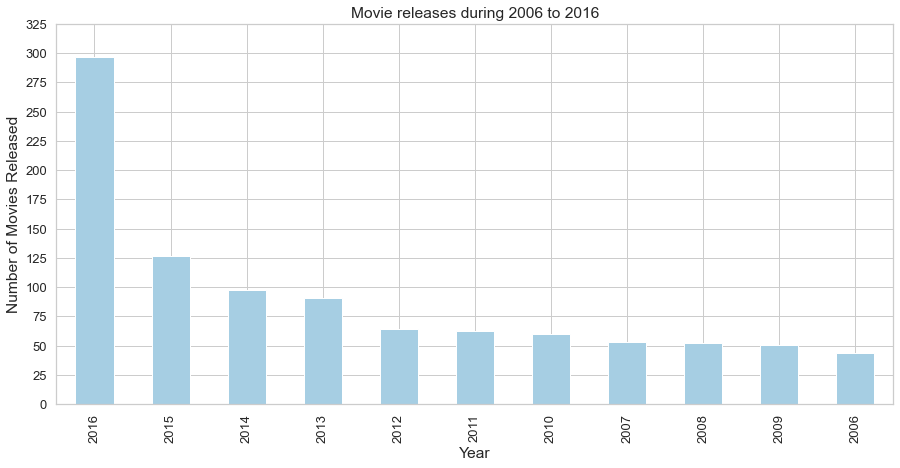

In [25]:
df_movies['Year'].value_counts().plot.bar(figsize=(15,7), colormap = 'Paired', fontsize=13, yticks=np.arange(0, 326, 25))

plt.xlabel('Year')
plt.ylabel('Number of Movies Released')
plt.title('Movie releases during 2006 to 2016')

plt.savefig('barchart.png')

#### **Observation:** 
- **Above chart clearly shows that Year *'2016'* produced *297* movies, which was the highest number of movies released during the period of 10 years.**

<a id=section50102></a>
####   5.1.2. Which year generated the highest revenue?

In [29]:
df_movies.groupby('Year')["Revenue (Millions)"].sum().sort_values(ascending=False)

Year
2016    18926.592982
2015    10015.509266
2014     8329.225505
2013     7915.589128
2012     6910.290000
2010     6238.519128
2009     5624.085505
2011     5514.916376
2008     5136.176376
2007     4638.055505
2006     3790.372752
Name: Revenue (Millions), dtype: float64

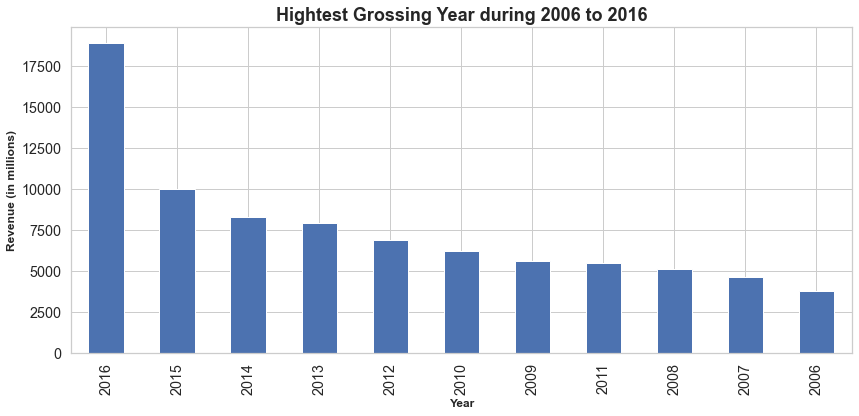

In [47]:
plt.figure(figsize = (14, 6))
df_movies.groupby('Year')["Revenue (Millions)"].sum().sort_values(ascending=False).plot(kind='bar', color='b')

plt.xlabel('Year', fontweight="bold", fontsize=12)
plt.ylabel('Revenue (in millions)', fontweight="bold", fontsize=12)
plt.title('Hightest Grossing Year during 2006 to 2016', fontweight="bold", fontsize=18)

plt.savefig('barcharthighestgrosser.png')

#### **Observation:** 
- **Similarly, the Year *'2016'* was the highest grosser of movies with USD 18926 MN (sum of revenue of all movies released in 2016) during the period of 10 years.**

<a id=section502></a>
### 5.2 Analysis Based on Movie Revenue

<a id=section50201></a>
####    5.2.1 Which are the Top 10 Highest Revenue making movies?

In [32]:
df_movies.iloc[df_movies["Revenue (Millions)"].sort_values(ascending=False)[:10].index, 1::8]

,Title,Revenue (Millions)
50,Star Wars: Episode VII - The Force Awakens,936.63
87,Avatar,760.51
85,Jurassic World,652.18
76,The Avengers,623.28
54,The Dark Knight,533.32
12,Rogue One,532.17
119,Finding Dory,486.29
94,Avengers: Age of Ultron,458.99
124,The Dark Knight Rises,448.13
578,The Hunger Games: Catching Fire,424.65


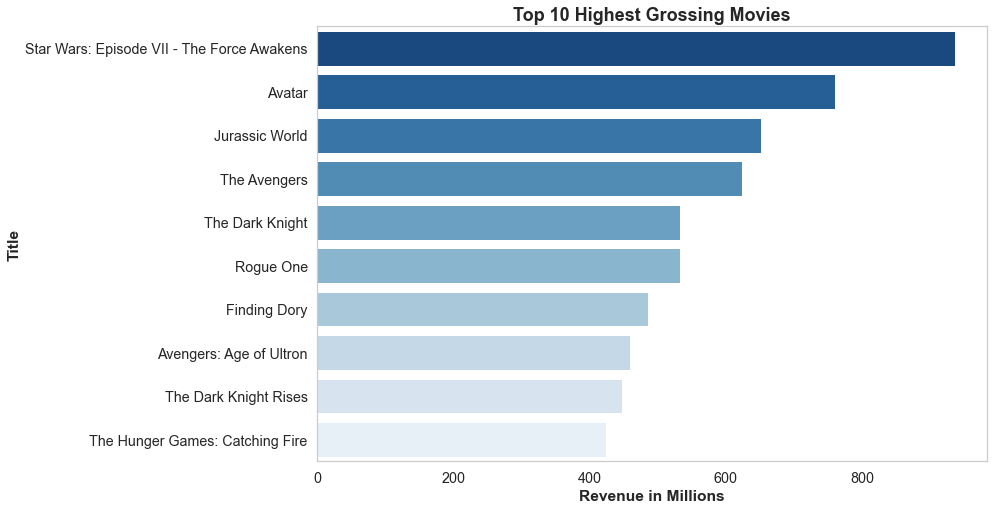

In [48]:
top_10_movies = df_movies.iloc[df_movies["Revenue (Millions)"].sort_values(ascending=False)[:10].index, 1::8]
plt.figure(figsize=(12,8))
sns.barplot(data=top_10_movies, x="Revenue (Millions)", y="Title", palette='Blues_r')

plt.xlabel("Revenue in Millions", fontweight="bold")
plt.ylabel('Title', fontweight="bold")
plt.title('Top 10 Highest Grossing Movies', fontweight="bold", fontsize=18)
plt.grid(False)
plt.savefig('barcharttop10movies.png')

#### **Observation :** 
- **Out of the Top 10 Revenue making movies; *'Star Wars: Episode VII - The Force Awakens'* was the highest grosser of movies which made USD 936 MN.**

<a id=section503></a>
### 5.3 Analyzing the coorelation between all the columns using heatmap

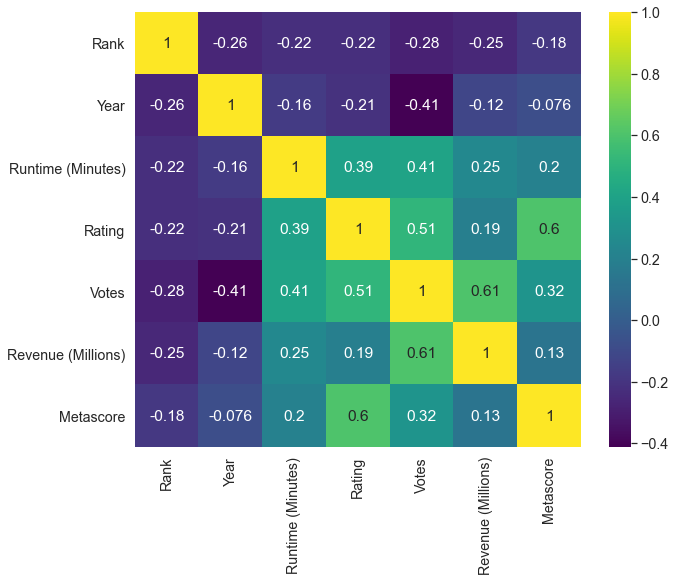

In [167]:
corr_mat = df_movies.corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_mat, annot=True, cmap='viridis')
plt.savefig('corrheatmap.png')

#### Observation:
- **The above Heatmap gives a complete overview of the corelations with each columns.** 
- **Movie 'Rating' shows positive corelation with 'Metascore', 'Revenue (Millions)', 'Votes and 'Runtime (Minutes)'.**
- **Question arises, how each of these parameters help in predicting the success of a movie?**

**Let's analyze the following in detail:** 

**1. If 'Rating' has any corelation with 'Metascore', 'Revenue (Millions)', 'Votes, and 'Runtime (Minutes)'**

**2. How useful would it be to predict a movie's success in terms of Revenue and other parameters?**

<a id=section504></a>
### 5.4 Comparison of movie ratings with each parameter

In [169]:
#Comparing 'Rating' with 'Metascore', 'Revenue (Millions)', 'Votes, and 'Runtime (Minutes)'

ratings_cor = ['Revenue (Millions)', 'Metascore', 'Runtime (Minutes)', 'Votes']

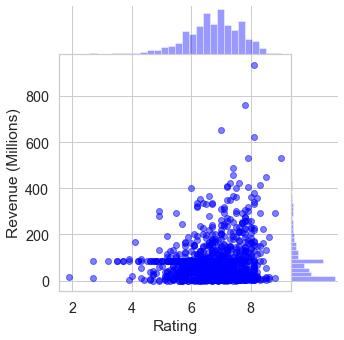

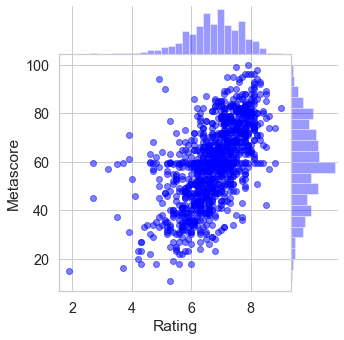

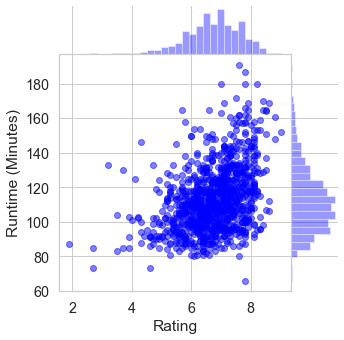

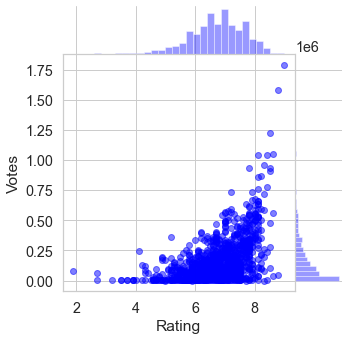

In [168]:
for comparison in ratings_cor:
    sns.jointplot(x='Rating', y=comparison, data=df_movies, alpha=0.5, color='Blue', size=5, space=0)

plt.savefig('Jointplotforratingcomparison.png')


- From the above chart, we can ascertain that **Metascore is highly corelated to Ratings**. **Audience rating was much close to the metascore (Critic rating).** 
- We can also see that most **high grosser movies are depended on Public Ratings**. And, its clear that the movies that are **highly rated by the public have earned quite a decent amount of revenue share**. 
- However, there's only fair corelation between the two. Hence, ratings cannot be the only source for a movie success but can certainly be one of the key aspects.**
- It is also interesting to see that a **movie run-time** can also **significantly affect** for a movie to receive a **good rating.**
- Lastly, audience has given **large number of votes and ratings** to the movies that they have loved the most. Lower the run-time, higher the rating.

<a id=section505></a>
### 5.5 Analysis Based on various movie Genres

<a id=section50501></a>
#### 5.5.1 Standardizing list of Genres by getting a unique list 

In [53]:
unique_genres = df_movies['Genre'].unique()
individual_genres = []
for genre in unique_genres:
    individual_genres.append(genre.split(','))

individual_genres = list(itertools.chain.from_iterable(individual_genres))
individual_genres = set(individual_genres)

individual_genres

{'Action',
 'Adventure',
 'Animation',
 'Biography',
 'Comedy',
 'Crime',
 'Drama',
 'Family',
 'Fantasy',
 'History',
 'Horror',
 'Music',
 'Musical',
 'Mystery',
 'Romance',
 'Sci-Fi',
 'Sport',
 'Thriller',
 'War',
 'Western'}

<a id=section50502></a>
#### 5.5.2 How many movies of each genre were released in each year?

Number of movies in each genre: 

Western 7
Drama 513
History 29
Biography 81
Comedy 279
Romance 141
Sport 18
Action 303
Sci-Fi 120
Animation 49
Musical 5
Music 21
Mystery 106
Adventure 259
Horror 119
War 13
Family 51
Thriller 195
Fantasy 101
Crime 150


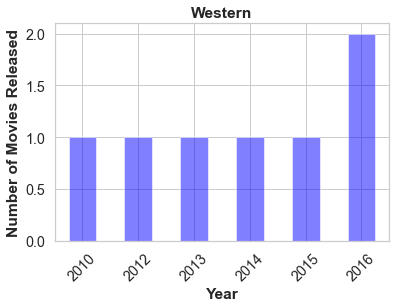

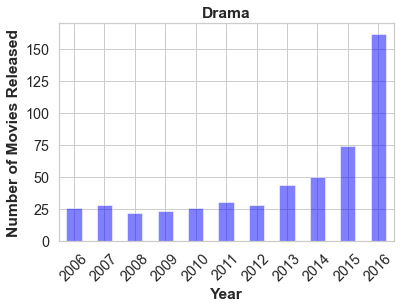

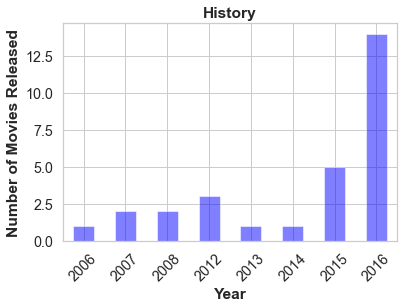

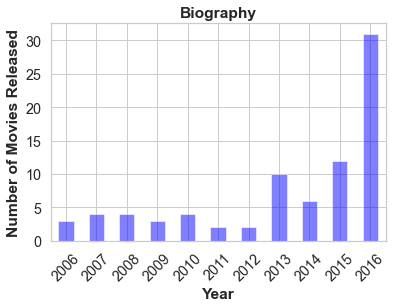

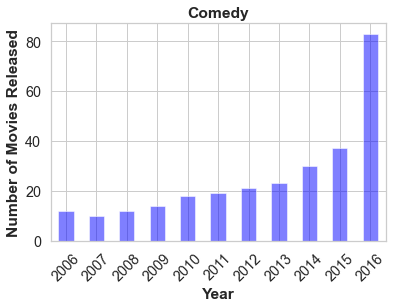

...

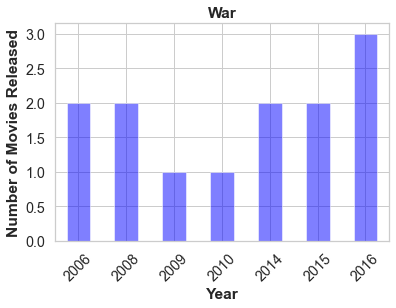

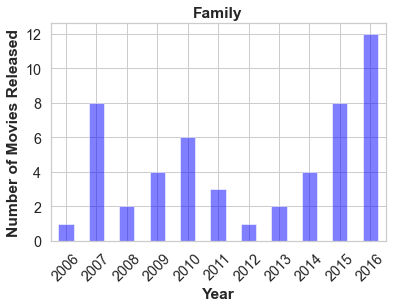

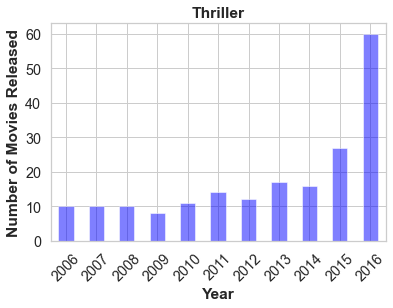

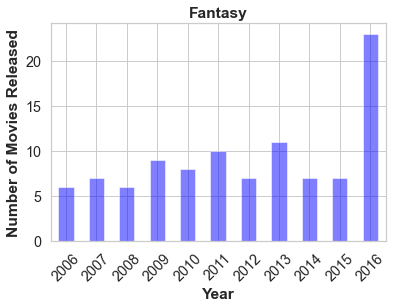

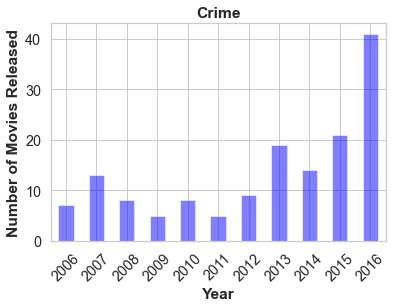

In [170]:
print('Number of movies in each genre: \n')

for genre in individual_genres:
    current_genre = df_movies['Genre'].str.contains(genre).fillna(False)
    plt.figure()
    plt.xlabel('Year', fontweight="bold")
    plt.ylabel('Number of Movies Released', fontweight="bold")
    plt.title(str(genre), fontweight="bold")
    df_movies[current_genre].Year.value_counts().sort_index().plot(kind='bar', color='Blue', alpha=0.5, rot=45)
    print(genre, len(df_movies[current_genre]))
    
plt.savefig('no_of_movies_each_genre.png')

**Observations:**

- **Movies Genres: Drama, Biography, Comedy, Romance, Action, Sci-Fi, Animation,etc are popular amongst viewers and was released every year throught the span of 10 years.** These Genres also saw **highest number of movies** made during this period.

- **While few others were not produced regularly and were made rarely at the max 6-8 times in 10 years period.**
- **Movie Genres: Western, War and Sports produced least number of movies during this decade.**

#### Movie count & Genres 
<a id=section50503></a>
#### 5.5.3 Determining the percentage of movies released in each Genre
***Note: Since some movies have multiple genres, these percentages won't add up to 100%.

In [65]:
genre_percent = np.zeros(len(individual_genres))
i = 0
for genre in individual_genres:
    current_genre = df_movies['Genre'].str.contains(genre).fillna(False)
    percent = len(df_movies[current_genre]) / 1000 * 100
    genre_percent[i] = percent
    i += 1
    
    print(genre, percent)

Western 0.7000000000000001
Drama 51.300000000000004
History 2.9000000000000004
Biography 8.1
Comedy 27.900000000000002
Romance 14.099999999999998
Sport 1.7999999999999998
Action 30.3
Sci-Fi 12.0
Animation 4.9
Musical 0.5
Music 2.1
Mystery 10.6
Adventure 25.900000000000002
Horror 11.899999999999999
War 1.3
Family 5.1
Thriller 19.5
Fantasy 10.100000000000001
Crime 15.0


In [70]:
df_genre_percent = pd.DataFrame(genre_percent, index=individual_genres, columns=['Genre %'])
df_genre_percent

,Genre %
Western,0.7
Drama,51.3
History,2.9
Biography,8.1
Comedy,27.9
Romance,14.1
Sport,1.8
Action,30.3
Sci-Fi,12.0
Animation,4.9


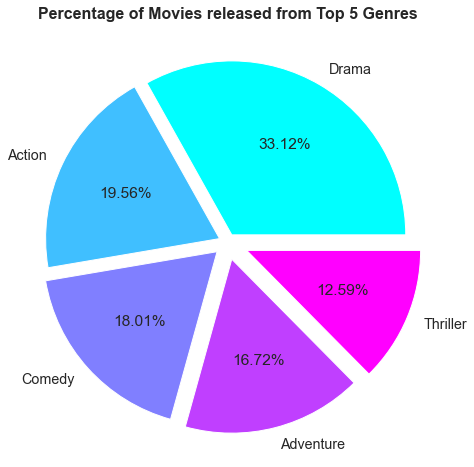

In [100]:
df_genre_percent.sort_values('Genre %', ascending=False)[:5].plot(kind='pie', explode=[0.05, 0.05, 0.08, 0.1, 0.12],
                                                                         legend=False, subplots=True, autopct='%.2f%%', figsize=(8,8), cmap='cool')
plt.ylabel('')
plt.title('Percentage of Movies released from Top 5 Genres', fontweight='bold', fontsize=16)
plt.savefig('piechart1.png')

#### **Observation:**

- From the above pie chart, we can see that **highest % of movies released** are of **Drama Genre** which comprises of **33.12%** of movies.

#### Revenue & Genres
<a id=section50504></a>
#### 5.5.4 Determining revenue percentage received from each Genre

In [133]:
genre_revenue_perc = np.zeros(len(individual_genres))
i = 0
for genre in individual_genres:
    current_genre = df_movies['Genre'].str.contains(genre).fillna(False)
    revenue_percent = df_movies[current_genre].xs('Revenue (Millions)', axis=1).sum() / df_movies['Revenue (Millions)'].sum() * 100
    genre_revenue_perc[i] = revenue_percent
    i += 1
    print(genre, revenue_percent)

Western 0.7729275196591113
Drama 30.31803772182683
History 1.902210125914527
Biography 5.785510124974495
Comedy 26.70306157375741
Romance 7.579547446458265
Sport 1.4386360909265343
Action 49.22093462408949
Sci-Fi 20.612663116294684
Animation 12.42432050890017
Musical 0.5643095271141182
Music 1.5403530870928626
Mystery 6.721035539293616
Adventure 53.709850263955474
Horror 4.718947009288069
War 0.7386578222554245
Family 8.546840414078586
Thriller 14.716090970771086
Fantasy 16.951072438315926
Crime 11.107059142945145


In [131]:
df_genre_revenue_perc = pd.DataFrame(genre_revenue_perc, index=individual_genres, columns=['Revenue %'])
df_genre_revenue_perc.sort_values('Revenue %', ascending=False)

,Revenue %
Adventure,53.709850
Action,49.220935
Drama,30.318038
Comedy,26.703062
Sci-Fi,20.612663
Fantasy,16.951072
Thriller,14.716091
Animation,12.424321
Crime,11.107059
Family,8.546840


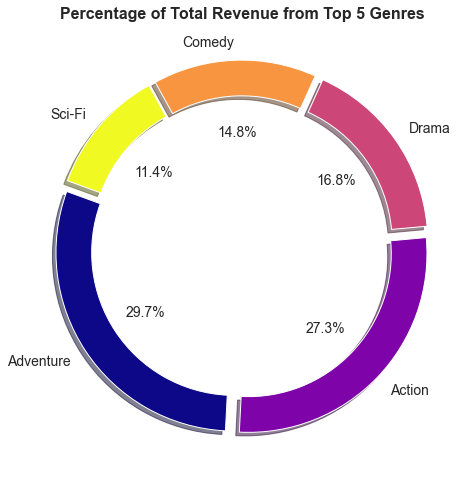

In [171]:
space = np.ones(5)/20
df_genre_revenue_perc.sort_values('Revenue %', ascending=False)[:5].plot(kind='pie', explode=space, fontsize=14, autopct='%3.1f%%', wedgeprops=dict(width=0.20), 
                                       shadow=True, startangle=160, figsize=(8,12), cmap='plasma', legend=False, subplots=True)

plt.ylabel('')
plt.title('Percentage of Total Revenue from Top 5 Genres', weight='bold', fontsize=16)
plt.savefig('Donut_rev_genre.png')

#### **Obervation:**

- The above pie chart clearly depicts that movies of **'Adventure'** Genre was the highest grosser with **29.75%** of total revenue.
- **'Action'** Genre which was **27.26%** was much closer to the highest percentage of revenue making Adventure Genre. 
- This concludes that Adventure and Action Genre movies are highest grosser Genres compared to the others. 

#### Ratings & Genres
<a id=section50505></a>
#### 5.5.5 Determining IMDB Ratings received for each Genre

In [138]:
genre_rating_total = np.zeros(len(individual_genres))
i=0
for genre in individual_genres:
    current_genre = df_movies['Genre'].str.contains(genre).fillna(False)
    rating_total = df_movies[current_genre].xs('Rating', axis=1).sum()
    genre_rating_total[i] = rating_total
    i += 1
    print(genre, rating_total)

Western 47.4
Drama 3567.3
History 206.69999999999996
Biography 590.5
Comedy 1854.7
Romance 942.7
Sport 126.2
Action 2004.1999999999998
Sci-Fi 806.0
Animation 358.9
Musical 34.699999999999996
Music 147.9
Mystery 730.0
Adventure 1754.0
Horror 724.6999999999999
War 95.6
Family 340.90000000000003
Thriller 1285.7
Fantasy 661.4
Crime 1018.0


In [139]:
df_genre_rating_total = pd.DataFrame(genre_rating_total, index=individual_genres, columns=['Sum of Rating'])

df_genre_rating_total.sort_values('Sum of Rating', ascending=False)

,Sum of Rating
Drama,3567.3
Action,2004.2
Comedy,1854.7
Adventure,1754.0
Thriller,1285.7
Crime,1018.0
Romance,942.7
Sci-Fi,806.0
Mystery,730.0
Horror,724.7


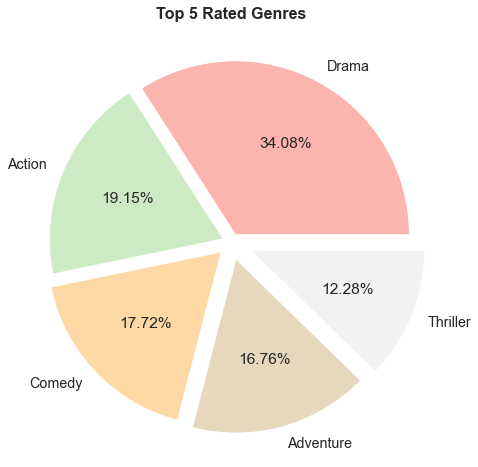

In [152]:
df_genre_rating_total.sort_values('Sum of Rating', ascending=False)[:5].plot(kind='pie', explode=(0.05, 0.05, 0.08, 0.1, 0.12),
                                                                           legend=False, subplots=True, autopct='%.2f%%', figsize=(8,8), cmap='Pastel1')
plt.ylabel('')
plt.title('Top 5 Rated Genres', weight='bold', fontsize=16)
plt.savefig('piechart3rating_genre.png')

#### Observation:
- The above chart shows us that the movies of **'Drama' Genre** was most popular amongst movie fanatics during this decade with ratings of **34.08%**.

#### Votes & Genre
<a id=section50506></a>
#### 5.5.6 Determining Audience Votes received for each Genre

In [153]:
genre_votes_total = np.zeros(len(individual_genres))
i=0
for genre in individual_genres:
    current_genre = df_movies['Genre'].str.contains(genre).fillna(False)
    votes_total = df_movies[current_genre].xs('Votes', axis=1).sum()
    genre_votes_total[i] = votes_total
    i += 1
    print(genre, votes_total)

Western 1796659
Drama 74784098
History 4189695
Biography 12308853
Comedy 39524025
Romance 17571068
Sport 2059836
Action 71435768
Sci-Fi 35344598
Animation 10199812
Musical 866881
Music 2745850
Mystery 19147305
Adventure 66819104
Horror 10466804
War 2987189
Family 7495269
Thriller 31142039
Fantasy 21696703
Crime 26340107


In [154]:
df_genre_votes_total = pd.DataFrame(genre_votes_total, index=individual_genres, columns=['Sum of Votes'])

df_genre_votes_total.sort_values('Sum of Votes', ascending=False)

,Sum of Votes
Drama,74784098.0
Action,71435768.0
Adventure,66819104.0
Comedy,39524025.0
Sci-Fi,35344598.0
Thriller,31142039.0
Crime,26340107.0
Fantasy,21696703.0
Mystery,19147305.0
Romance,17571068.0


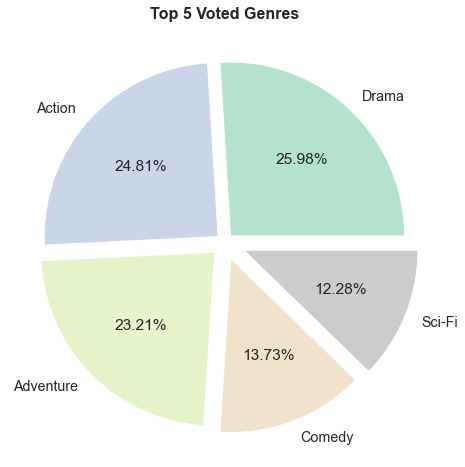

In [155]:
df_genre_votes_total.sort_values('Sum of Votes', ascending=False)[:5].plot(kind='pie', explode=(0.05, 0.05, 0.08, 0.1, 0.12),
                                                                           legend=False, subplots=True, autopct='%.2f%%', figsize=(8,8), cmap='Pastel2')
plt.ylabel('')
plt.title('Top 5 Voted Genres', weight='bold', fontsize=16)
plt.savefig('piechart4votes_genre.png')

#### Observation:
- Similarly as we saw with the Audience ratings, public **voted** the highest for **'Drama' Genre** with **25.98% votes**. 
- **Action and Adventure received close enough votes as 'Drama'.**
- This shows that if the public appreciates a movie, they not only vote more, they also give a good rating.

<a id=section506></a>
### 5.6 Analysis Based on the Director of the movies

<a id=section50601></a>
#### 5.6.1 Which are the Top 10 Movie Directors who has made highest number of movies?

In [80]:
df_movies['Director'].value_counts()[:10]

Ridley Scott          8
M. Night Shyamalan    6
Paul W.S. Anderson    6
David Yates           6
Michael Bay           6
Denis Villeneuve      5
Antoine Fuqua         5
Justin Lin            5
Woody Allen           5
Christopher Nolan     5
Name: Director, dtype: int64

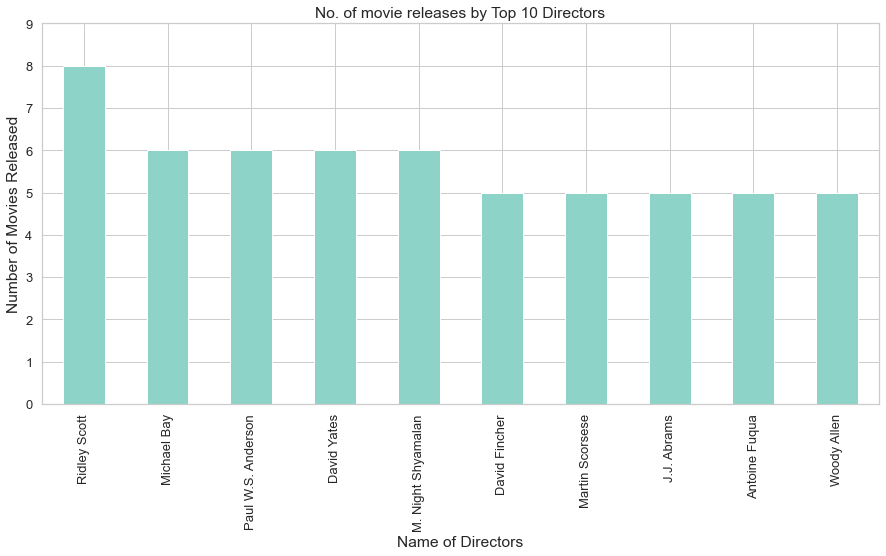

In [20]:
df_movies['Director'].value_counts()[:10].plot.bar(figsize=(15,7), colormap = 'Set3', fontsize=13, yticks=np.arange(0, 10, 1))

plt.xlabel('Name of Directors')
plt.ylabel('Number of Movies Released')
plt.title('No. of movie releases by Top 10 Directors')

plt.savefig('barchart_Director.png')

<a id=section50602></a>
#### 5.6.2 Which are the Top 10 movie Directors in terms of Revenue contribution?

In [81]:
df_movies.groupby('Director')['Revenue (Millions)'].sum().sort_values(ascending=False)[:10]

Director
J.J. Abrams          1683.45
David Yates          1630.51
Christopher Nolan    1515.09
Michael Bay          1421.32
Francis Lawrence     1299.81
Joss Whedon          1082.27
Jon Favreau          1025.60
Zack Snyder           975.74
Peter Jackson         860.45
Gore Verbinski        829.82
Name: Revenue (Millions), dtype: float64

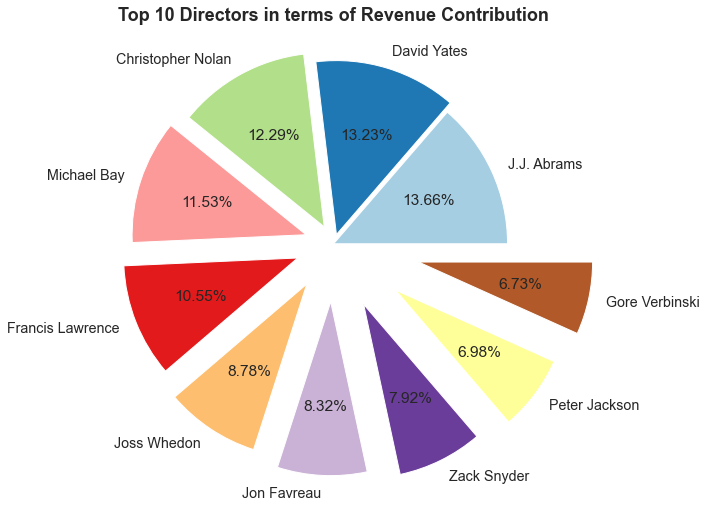

In [151]:
df_movies.groupby('Director')['Revenue (Millions)'].sum().sort_values(ascending=False)[:10].plot(kind='pie', 
                        explode = np.linspace(0, 0.5, 10), legend=False, subplots=True, autopct='%.2f%%', 
                        figsize=(8,8), cmap='Paired')

plt.ylabel('')

plt.title('Top 10 Directors in terms of Revenue Contribution', weight='bold', fontsize=18)
plt.savefig('piechart3.png')

#### Observation: 

- From the above pie chart, we can infer that, **JJ Abrams** with **13.66% Revenue share** has Directed the **highest grosser** movies of the decade. One of them being, **'Star Wars: Episode VII - The Force Awakens'** which we already saw was the **highest grossing movie** of the decade.
- However, **David Yates** was much **closer to JJ Abrams** with **13.23%** revenue share.
- It is also observed that, though Ridley Scott has topped the charts for making maximum number of movies during the decade, however, his revenue share is not amongst the top 10.

<a id=section6></a>
## 6. Conclusion:

- **Summarizing the above analysis and their findings**:
    - **Year 2016** produced **highest number of movies and earned highest revenues** during the decade of 2006-2016.
    - Out of the Top 10 revenue making movies, **‘Star Wars: Episode VII - The Force Awakens’ topped the box office**.
    - **Audience ratings** of movies (Ratings) were quite **close** to the **Crtic ratings** (Metascore).
    - **The more the public appreciated a film, the more they voted and gave a good rating.**
    - **Lower the run-time, higher the rating.**
    - **Movies Genres; Drama, Biography, Comedy, Romance, Action, etc was released every year** in this decade.
    - **Highest number of movies** were made **‘Drama’** Genre.
    - In terms of **revenue**, **Adventure Genre made more money than other genres**, however, Action Genre made close enough.
    - **Audience rated Drama genre the highest of all.**
    - Though the **Directors** who made **higher number of movies**, they **did not earn high revenue share**.
    
    
- After conducting a detailed analysis on the data with various graphs and range values in percentage obtained, this is to conclude that, IMBD does have various **other factors (like Movie Genre, Metascore & Movie Run-time)** other than 'Ratings' which has significant influence for a movie to become a chart buster/high grosser.
    

<a id=section601></a>
### 6.1 Actionable Insights:

- Hence, it would prove highly beneficial for movie business professionals to utilize these parameters such as **Genre, Metascore, Public Votes and Movie Runtime** to predict the box-office success of movies.


- Further to predict the successfactor of a movie, a **'Recommendation Engine'** can be built to study the audience's past behaviour on similar type of movies/movie genres.  